In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 7.4 MB/s 


# COVID-19 Predictions using Vision Transformer(ViT) and interpretations using GRAD-CAMs for explainability

![ViT](https://1.bp.blogspot.com/-_mnVfmzvJWc/X8gMzhZ7SkI/AAAAAAAAG24/8gW2AHEoqUQrBwOqjhYB37A7OOjNyKuNgCLcBGAsYHQ/s1600/image1.gif)

### How the Vision Transformer works in a nutshell

The total architecture is called Vision Transformer (ViT in short). Let’s examine it step by step.

- Split an image into patches

- Flatten the patches

- Produce lower-dimensional linear embeddings from the flattened patches

- Add positional embeddings

- Feed the sequence as an input to a standard transformer encoder

- Pretrain the model with image labels (fully supervised on a huge dataset)

- Finetune on the downstream dataset for image classification

[Source: AI Summer Vision Transformer](https://theaisummer.com/vision-transformer/#how-the-vision-transformer-works-in-a-nutshell)

### Importing libraries

In [ ]:
import numpy as np 
import pandas as pd 
import os
import gc
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

# Display
from IPython.display import Image, display
from IPython import display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io

AUTOTUNE = tf.data.experimental.AUTOTUNE

In [ ]:
BASE_PATH = 'drive/My Drive/Colab Notebooks/'
train_study = pd.read_csv(BASE_PATH + 'train_study_level.csv')
train_study.head()

,id,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
0,00086460a852_study,0,1,0,0
1,000c9c05fd14_study,0,0,0,1
2,00292f8c37bd_study,1,0,0,0
3,005057b3f880_study,1,0,0,0
4,0051d9b12e72_study,0,0,0,1


In [ ]:
train_image = pd.read_csv(BASE_PATH + 'train_image_level.csv')
train_image.head()

,id,boxes,label,StudyInstanceUID
0,000a312787f2_image,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75
1,000c3a3f293f_image,NaN,none 1 0 0 1 1,ff0879eb20ed
2,0012ff7358bc_image,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7
3,001398f4ff4f_image,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2
4,001bd15d1891_image,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e


In [ ]:
sample_submission = pd.read_csv(BASE_PATH + 'sample_submission.csv')
sample_submission.head()

,id,PredictionString
0,00188a671292_study,negative 1 0 0 1 1
1,004bd59708be_study,negative 1 0 0 1 1
2,00508faccd39_study,negative 1 0 0 1 1
3,006486aa80b2_study,negative 1 0 0 1 1
4,00655178fdfc_study,negative 1 0 0 1 1


In [ ]:
train_study['id'] = train_study['id'].str.replace('_study',"")
train_study.rename({'id': 'StudyInstanceUID'},axis=1, inplace=True)
train_study.head(3)
# df_std.sort_values(by=['StudyInstanceUID'],inplace=True)
train_study.head()

,StudyInstanceUID,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance
0,00086460a852,0,1,0,0
1,000c9c05fd14,0,0,0,1
2,00292f8c37bd,1,0,0,0
3,005057b3f880,1,0,0,0
4,0051d9b12e72,0,0,0,1


In [ ]:
img_size = 512
BASE_PATH = 'drive/My Drive/Colab Notebooks/SIIM-COVID-19-512-jpg-image-Dataset/'
collection = pd.read_csv(os.path.join(BASE_PATH,"train.csv" ))
collection['filepath'] = [os.path.join(BASE_PATH,"train",id_+'.jpg')for id_ in collection['image_id']]
collection.head()

,boxes,label,StudyInstanceUID,image_id,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,filepath
0,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,000a312787f2,0,1,0,0,drive/My Drive/Colab Notebooks/SIIM-COVID-19-5...
1,NaN,none 1 0 0 1 1,ff0879eb20ed,000c3a3f293f,1,0,0,0,drive/My Drive/Colab Notebooks/SIIM-COVID-19-5...
2,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,0012ff7358bc,0,1,0,0,drive/My Drive/Colab Notebooks/SIIM-COVID-19-5...
3,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,001398f4ff4f,0,0,0,1,drive/My Drive/Colab Notebooks/SIIM-COVID-19-5...
4,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,001bd15d1891,0,1,0,0,drive/My Drive/Colab Notebooks/SIIM-COVID-19-5...


In [ ]:
target = np.array(collection[['Negative for Pneumonia','Typical Appearance','Indeterminate Appearance','Atypical Appearance']])

### Splitting the image dataset 

In [ ]:
X_train, X_test, y_train, y_test  = train_test_split(collection.filepath, target, test_size=0.33, random_state=42)
print(f"train shape: {X_train.shape}- y_train shape: {y_train.shape}")
print(f"test shape: {X_test.shape}- y_test shape: {y_test.shape}")

train shape: (4243,)- y_train shape: (4243, 4)
test shape: (2091,)- y_test shape: (2091, 4)


### Setting the Hyperparameters

In [ ]:
num_classes = 4
input_shape = (512, 512, 1)

In [ ]:
learning_rate = 1e-5 #0.001
weight_decay = 0.0001
batch_size = 256
num_epochs = 700

# We'll resize input images to this size
image_size =  256 

# Size of the patches to be extract from the input images
patch_size = 20  
num_patches = (image_size // patch_size) ** 2
projection_dim = 128 #64
num_heads = 4 #4

# Size of the transformer layers
transformer_units = [
    projection_dim * 2,
    projection_dim,
]  
transformer_layers = 8 #8

# Size of the dense layers of the final classifier
mlp_head_units = [256] #[1024, 512]  

In [ ]:
@tf.function
def load(image_file, target):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)

    image_ = tf.cast(image, tf.float32)
    return image_, target

### Train and Test Loaders

In [ ]:
train_loader = (
    tf.data.Dataset
    .from_tensor_slices((X_train,y_train))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(batch_size)
)

test_loader = (
    tf.data.Dataset
    .from_tensor_slices((X_test,y_test))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(batch_size)
)

In [ ]:
train_batch = (
    tf.data.Dataset
    .from_tensor_slices((X_train,y_train))
    .map(load, num_parallel_calls=AUTOTUNE)
    .shuffle(7)
    .batch(X_train.shape[0]-100)
)

next(iter(train_batch))[0].shape

TensorShape([4143, 512, 512, 1])

### Implementinging Data Augmentation to the images

In [ ]:
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.Normalization(),
        layers.experimental.preprocessing.Resizing(image_size, image_size),
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(factor=0.02),
        layers.experimental.preprocessing.RandomZoom(
            height_factor = 0.2, width_factor = 0.2
        ),
    ],
     name="data_augmentation",
)

# Compute the mean and the variance of the training data for normalization.
CompleteBatchData  = next(iter(train_batch))[0]
data_augmentation.layers[0].adapt(CompleteBatchData)

In [ ]:
#del CompleteBatchData
gc.collect()

929

### Defining our Multi Layer Perceptron

In [ ]:
def mlp(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation = tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

### Implementing Patches creation of image
The patches of the image will be created which will be used as a layer of images to be fed into the vision transformer

In [ ]:
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size
        
    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images = images,
            sizes = [1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        #print(patches.shape)
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

#### Let's plot the patched image of the original image

Image size: 256 X 256
Patch size: 20 X 20
Patches per image: 144
Elements per patch: 400


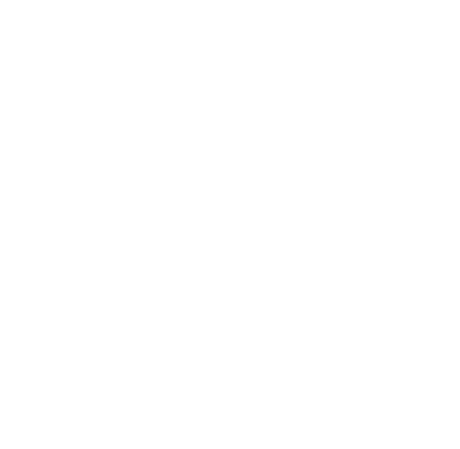

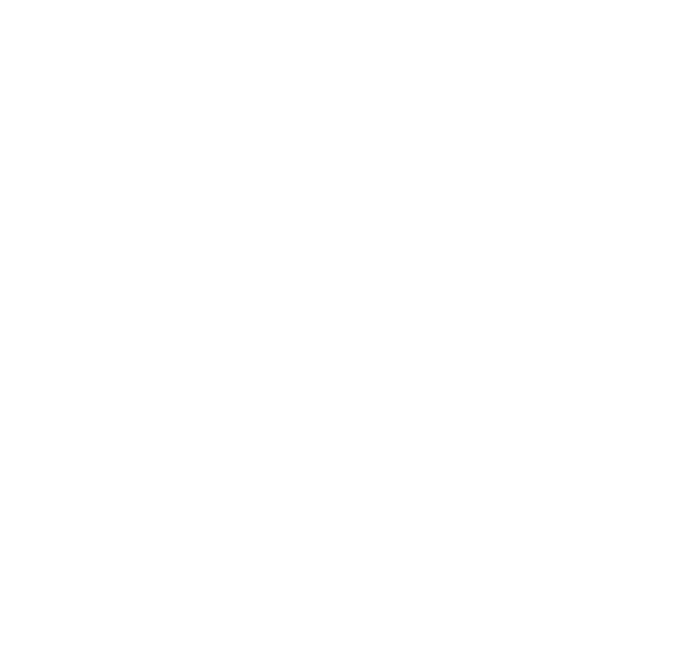

In [ ]:
plt.figure(figsize=(8, 8))
image = next(iter(train_loader))[0][5]
#plt.imshow(image, cmap='gray')
#cv2_imshow(image)
display.Image(image)
plt.axis("off")

resized_image = tf.image.resize(
    tf.convert_to_tensor([image]), size=(image_size, image_size)
)
#print(resized_image.shape)
patches = Patches(patch_size)(resized_image)
print(f"Image size: {image_size} X {image_size}")
print(f"Patch size: {patch_size} X {patch_size}")
print(f"Patches per image: {patches.shape[1]}")
print(f"Elements per patch: {patches.shape[-1]}")

n = int(np.sqrt(patches.shape[1]))

plt.figure(figsize=(12, 12))
for i, patch in enumerate(patches[0]):
    ax = plt.subplot(n, n, i + 1)
    patch_img = tf.reshape(patch, (patch_size, patch_size, 1))
    #plt.imshow(patch_img,cmap='gray')
    plt.axis("off")

### Patch Encoder layer

This layer will transform a patch by projecting it as a linear vector of the size of projection dimension.

In addition, to it the patch encoding layer will also add position embedding to the projected vector which is learned from the layer.

![Position Embeddings](https://theaisummer.com/static/327309a892d82b4f59eb07818ee28ee6/48711/visualizing-positional-encodings-vit.png)

The transformer encoder operates on a patch-level. Learning embeddings that capture the order relationships between patches (spatial information) is not so crucial. It is relatively easier to understand the relationships between patches of P x P than of a full image Height x Width.

In [ ]:
class PatchEncoder(layers.Layer):
    def __init__(self, num_of_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units = projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim = num_patches, output_dim = projection_dim
        )
        
    def call(self, patch):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encode = self.projection(patch) + self.position_embedding(positions)
        return encode

### The ViT model

The Vision Transformer (ViT), a vision model based as closely as possible on the Transformer architecture originally designed for text-based tasks. ViT represents an input image as a sequence of image patches, similar to the sequence of word embeddings used when applying Transformers to text, and directly predicts class labels for the image. ViT demonstrates excellent performance when trained on sufficient data, outperforming a comparable state-of-the-art CNN with four times fewer computational resources.
 
The ViT model consists of multiple Transformer blocks, which use the layers.MultiHeadAttention layer as a self-attention mechanism applied to the sequence of patches. The Transformer blocks produce a [batch_size, num_patches, projection_dim] tensor, which is processed via an classifier head with softmax to produce the final class probabilities output.

Unlike the technique described in the [paper](https://arxiv.org/abs/2010.11929), which prepends a learnable embedding to the sequence of encoded patches to serve as the image representation, all the outputs of the final Transformer block are reshaped with layers.Flatten() and used as the image representation input to the classifier head. Note that the layers.GlobalAveragePooling1D layer could also be used instead to aggregate the outputs of the Transformer block, especially when the number of patches and the projection dimensions are large.

[Source: Google AI Blog](https://ai.googleblog.com/2020/12/transformers-for-image-recognition-at.html)


![Tramsformer Encoder](https://theaisummer.com/static/aa65d942973255da238052d8cdfa4fcd/7d4ec/the-transformer-block-vit.png)



In [ ]:
def vit_model():
    inputs = layers.Input(shape=input_shape)
    
    # Augment data.
    augmented = data_augmentation(inputs)
    
    # Create patches.
    patches = Patches(patch_size)(augmented)
    
    # Encode patches.
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)
    
    # Create multiple layers of the Transformer block.
    for _ in range(transformer_layers):
        
        # Layer normalization 1.
        x1 = layers.BatchNormalization()(encoded_patches)
        
        # create a multi-head attention layer
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.1
        )(x1, x1)
        
        # Skip connection 1.
        x2 = layers.Add()([attention_output, encoded_patches])
        
        # Layer normalization 2.
        x3 = layers.BatchNormalization()(x2)
        
        # MLP.
        x3 = mlp(x3, hidden_units=transformer_units, dropout_rate=0.1)
        
        # Skip connection 2.
        encoded_patches = layers.Add()([x3, x2])
        
    # Create a [batch_size, projection_dim] tensor.
    representation = layers.LayerNormalization()(encoded_patches)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    
    # Add MLP
    features = mlp(representation, hidden_units = mlp_head_units, dropout_rate=0.5)
    
    # Classify outputs.
    logits = layers.Dense(num_classes, activation='softmax')(features)
    
    # create keras model
    model = keras.Model(inputs=inputs, outputs=logits)
    return model

#### Defining the experiment

In [ ]:
def experiment(model):
    optimizer = tfa.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    )
    
    model.compile(
        optimizer=optimizer,
        loss=keras.losses.CategoricalCrossentropy(from_logits=True),
        metrics=[
            keras.metrics.CategoricalAccuracy(name="accuracy"),
            keras.metrics.AUC( name="AUC"),
        ],
     )
    
    checkpoint_filepath = "./tmp/checkpoint"
    checkpoint_callback = keras.callbacks.ModelCheckpoint(
        checkpoint_filepath,
        monitor="val_accuracy",
        save_best_only=True,
        save_weights_only=True,
    )

    history = model.fit(train_loader ,
                        batch_size=batch_size,
                        epochs=num_epochs,
                        validation_data=test_loader,
                        callbacks=[checkpoint_callback],)
    model.load_weights(checkpoint_filepath)
    _, accuracy, auc = model.evaluate(test_loader)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")
    print(f"Test AUC: {round(auc * 100, 2)}%")

    return history

#### ViT model summary

In [ ]:
vit_classifier = vit_model()
vit_classifier.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
data_augmentation (Sequential)  (None, 256, 256, 1)  3           input_1[0][0]                    
__________________________________________________________________________________________________
patches_1 (Patches)             (None, None, 400)    0           data_augmentation[0][0]          
__________________________________________________________________________________________________
patch_encoder (PatchEncoder)    (None, 144, 128)     69760       patches_1[0][0]                  
______________________________________________________________________________________________

#### ViT model layer plot

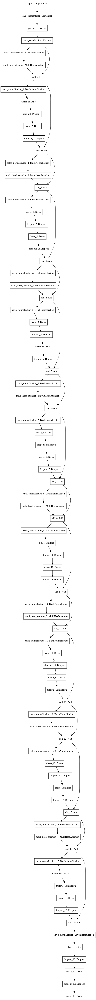

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(vit_classifier)

### Training the ViT model 

In [ ]:
history = experiment(vit_classifier)

Epoch 1/700


/usr/local/lib/python3.7/dist-packages/keras/backend.py:4847: UserWarning: "`categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`categorical_crossentropy` received `from_logits=True`, but '


17/17 [==============================] - 205s 12s/step - loss: 2.7334 - accuracy: 0.3198 - AUC: 0.5740 - val_loss: 1.5940 - val_accuracy: 0.4582 - val_AUC: 0.7010
Epoch 2/700
17/17 [==============================] - 18s 1s/step - loss: 2.2189 - accuracy: 0.3804 - AUC: 0.6478 - val_loss: 1.4045 - val_accuracy: 0.4993 - val_AUC: 0.7319
Epoch 3/700
17/17 [==============================] - 18s 1s/step - loss: 2.0450 - accuracy: 0.3747 - AUC: 0.6391 - val_loss: 1.3148 - val_accuracy: 0.5041 - val_AUC: 0.7334
Epoch 4/700
17/17 [==============================] - 18s 1s/step - loss: 1.9123 - accuracy: 0.3912 - AUC: 0.6469 - val_loss: 1.2894 - val_accuracy: 0.5069 - val_AUC: 0.7342
Epoch 5/700
17/17 [==============================] - 18s 1s/step - loss: 1.7941 - accuracy: 0.4002 - AUC: 0.6585 - val_loss: 1.2358 - val_accuracy: 0.5098 - val_AUC: 0.7388
Epoch 6/700
17/17 [==============================] - 18s 1s/step - loss: 1.6880 - accuracy: 0.4103 - AUC: 0.6656 - val_loss: 1.2090 - val_accurac

In [ ]:
# list all data in history
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'AUC', 'val_loss', 'val_accuracy', 'val_AUC'])


### Plotting the model performance

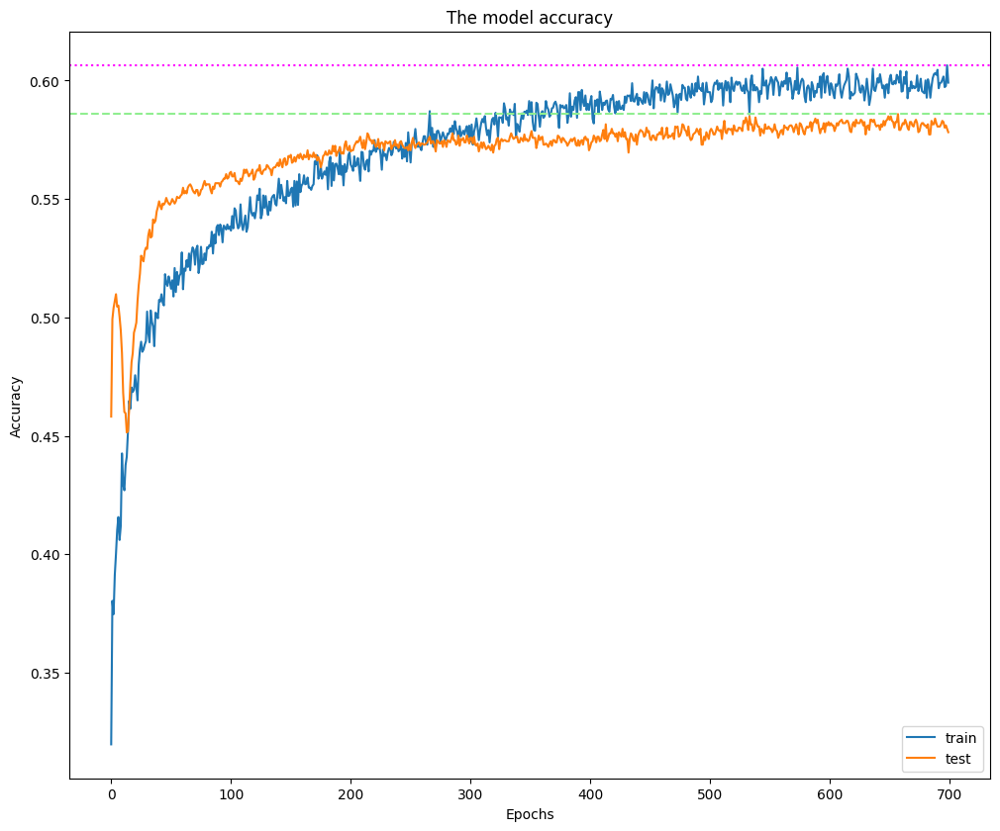

In [ ]:
# summarize history for accuracy
plt.figure(figsize=(12,10), dpi=100)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.axhline([max(history.history['accuracy'])], color ="magenta", linestyle =":")
plt.axhline([max(history.history['val_accuracy'])], color ="lightgreen", linestyle ="--")
plt.title('The model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

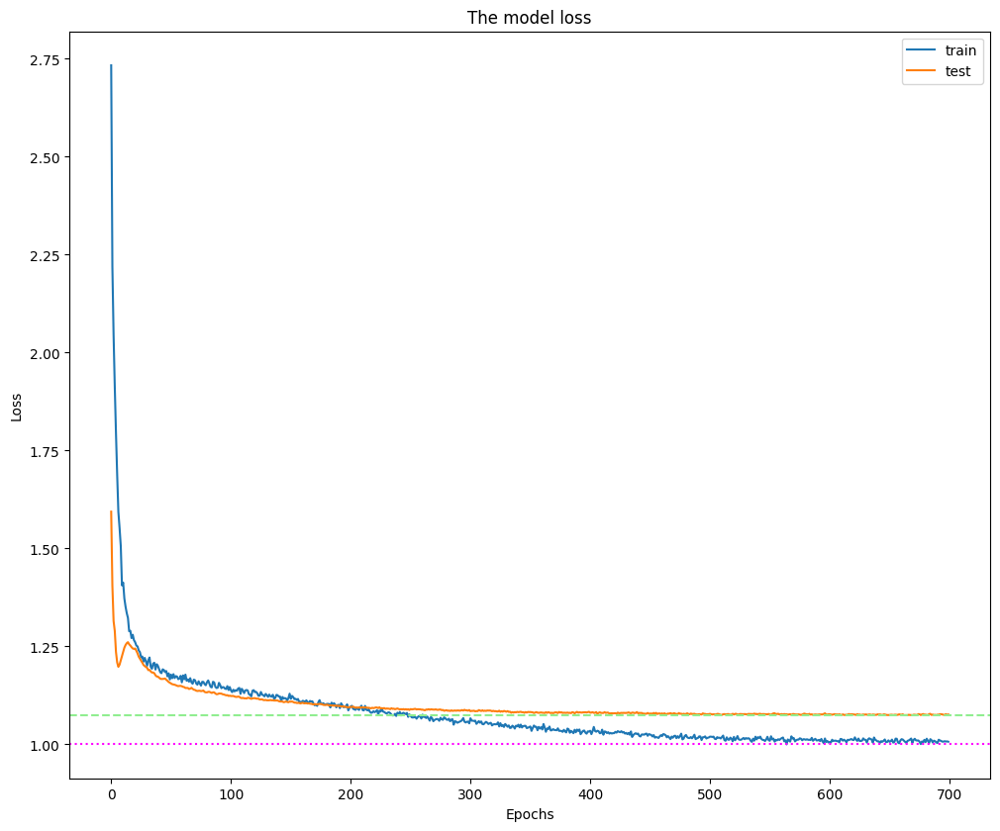

In [ ]:
# summarize history for loss
plt.figure(figsize=(12,10), dpi=100)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.axhline([min(history.history['loss'])], color ="magenta", linestyle =":")
plt.axhline([min(history.history['val_loss'])], color ="lightgreen", linestyle ="--")
plt.title('The model loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

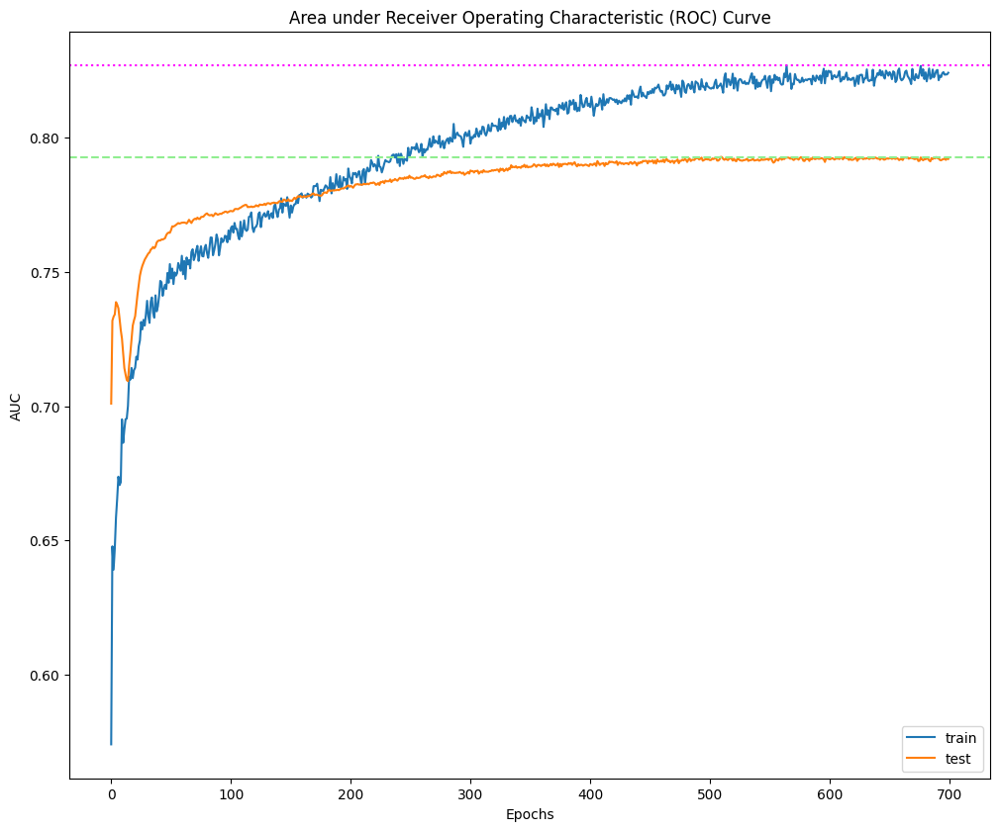

In [ ]:
# summarize history for loss
plt.figure(figsize=(12,10), dpi=100)
plt.plot(history.history['AUC'])
plt.plot(history.history['val_AUC'])
plt.axhline([max(history.history['AUC'])], color ="magenta", linestyle =":")
plt.axhline([max(history.history['val_AUC'])], color ="lightgreen", linestyle ="--")
plt.title('Area under Receiver Operating Characteristic (ROC) Curve')
plt.ylabel('AUC')
plt.xlabel('Epochs')
plt.legend(['train', 'test'], loc='lower right')
plt.show()

In [ ]:
vit_classifier.load_weights("./tmp/checkpoint")

In [ ]:
def get_img_array(img):
    
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

### Grad-CAM algorithm

In [ ]:
def gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.input], [model.get_layer(last_conv_layer_name).output,  model.output]
    )
    
    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
        
        
    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))
    
    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output#[0]
   
    #print(np.expand_dims(last_conv_layer_output,axis=0))
    #print(pooled_grads[..., tf.newaxis])
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

### Superimposed visualizations on Gradcam

In [ ]:
def display_gradcam(img, heatmap, cam_path="cam.jpg", alpha=0.6,preds=[0,0,0,0], plot=None):

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    #superimposed_img.save(cam_path)
    
    

    #img.append(test_image)
    #Nfp.append(preds[0])
    #TyApp.append(preds[1])
    #IntApp.append(preds[2])
    #AtyApp.append(preds[3])
    
    # Display Grad CAM
    #display(Image(cam_path))
    #plt.figure(figsize=(8,8))
    plot.imshow(superimposed_img)
    plot.set(title =
        "Negative for Pneumonia: \
        {:.3f}\nTypical Appearance: \
        {:.3f}\nIndeterminate Appearance: \
        {:.3f}\nAtypical Appearance: \
        {:.3f}".format(preds[0], \
                    preds[1], \
                    preds[2], \
                    preds[3])
    )
    plot.axis('off')
    #plt.show()

Predicted:
Negative for Pneumonia:     -1.0216705799102783
Typical Appearance: 1.4489755630493164
Indeterminate Appearance:     -0.18751661479473114
Atypical Appearance: -0.4493928551673889


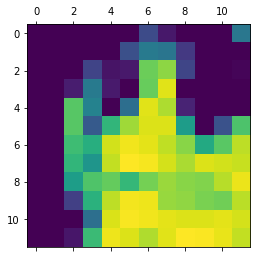

In [ ]:
test_image = next(iter(test_loader))[0][5]
# Prepare image
img_array =get_img_array(test_image)

last_conv_layer_name = 'layer_normalization'

# Remove last layer's softmax
vit_classifier.layers[-1].activation = None

# Print what the top predicted class is
preds = vit_classifier.predict(img_array)
print("Predicted:\n" +"Negative for Pneumonia: \
    {p1}\nTypical Appearance: {p2}\nIndeterminate Appearance: \
    {p3}\nAtypical Appearance: {p4}".format(p1=preds[0][0], \
                                            p2=preds[0][1],p3=preds[0][2],p4=preds[0][3]))

#print(test_image)
#if (submission['StudyInstanceUID']== test_image):
    #submission['NfP'] = preds[0]
    #submission['TyApp'] = preds[1]
    #submission['IntApp'] = preds[2]
    #submission['AtyApp'] = preds[3]

# Generate class activation heatmap
heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

heatmap = np.reshape(heatmap, (12,12))

# Display heatmap
plt.matshow(heatmap)

plt.show()

### Heat-Map Visualization over Test-set

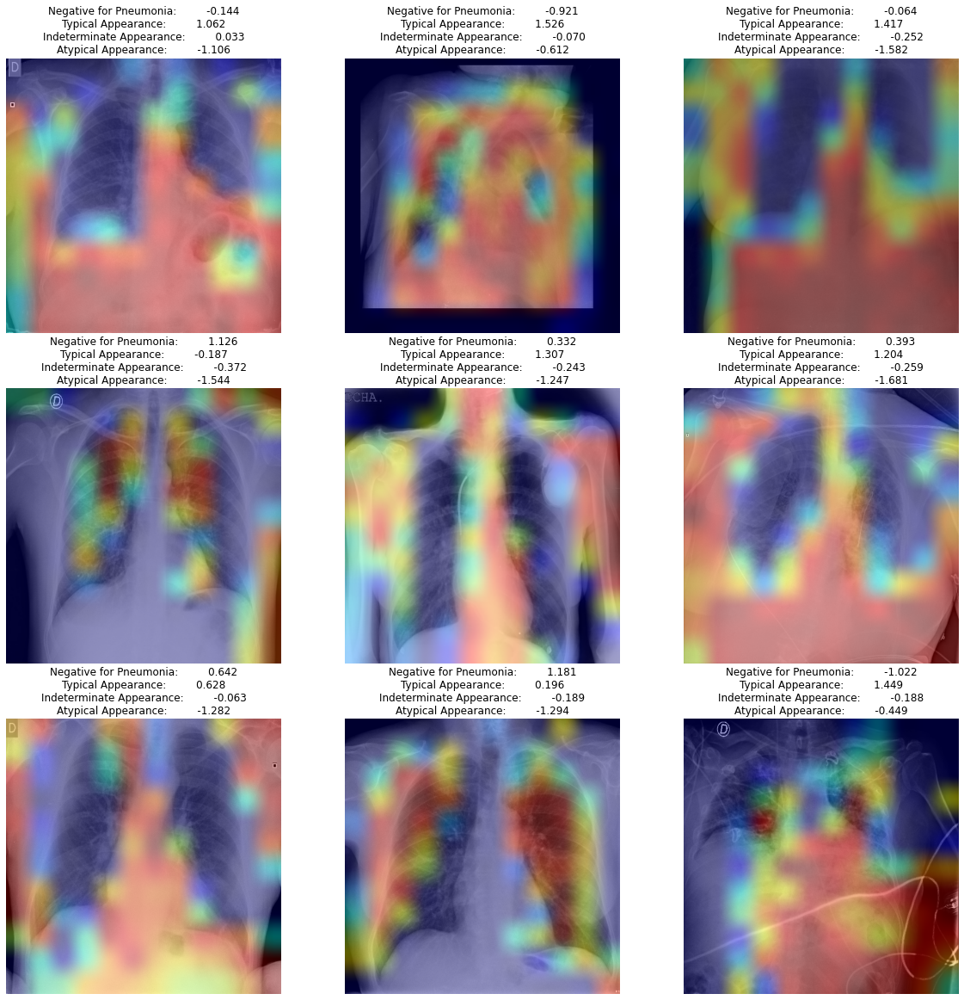

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][:9], axis.flat):
    img_array =get_img_array(images)
    
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

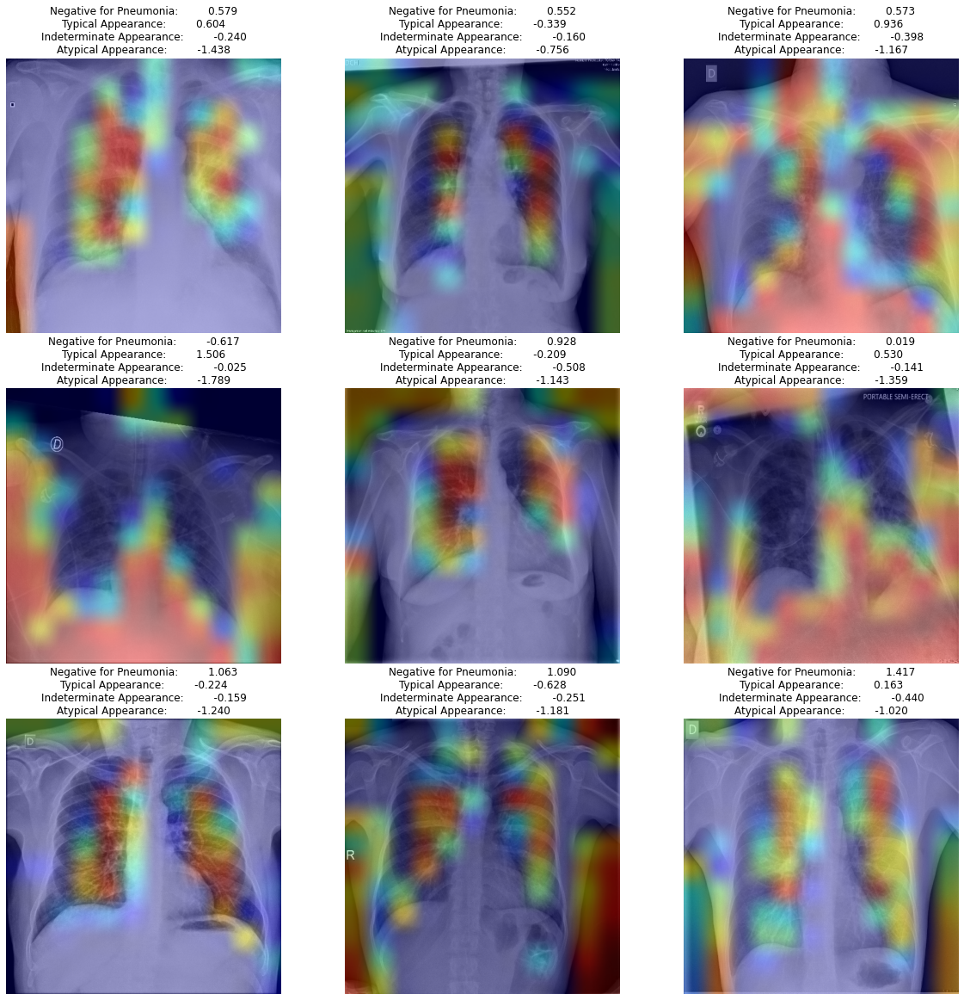

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][20:29], axis.flat):
    img_array =get_img_array(images)
    
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

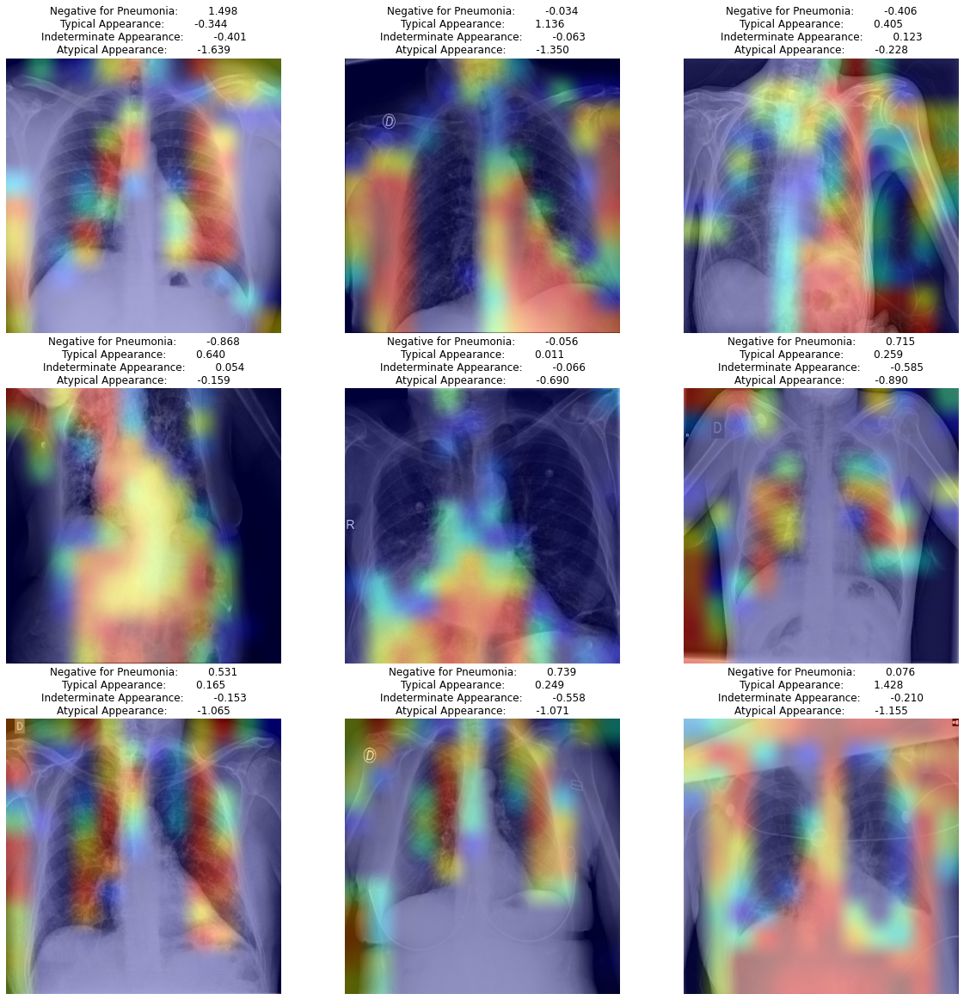

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][50:59], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

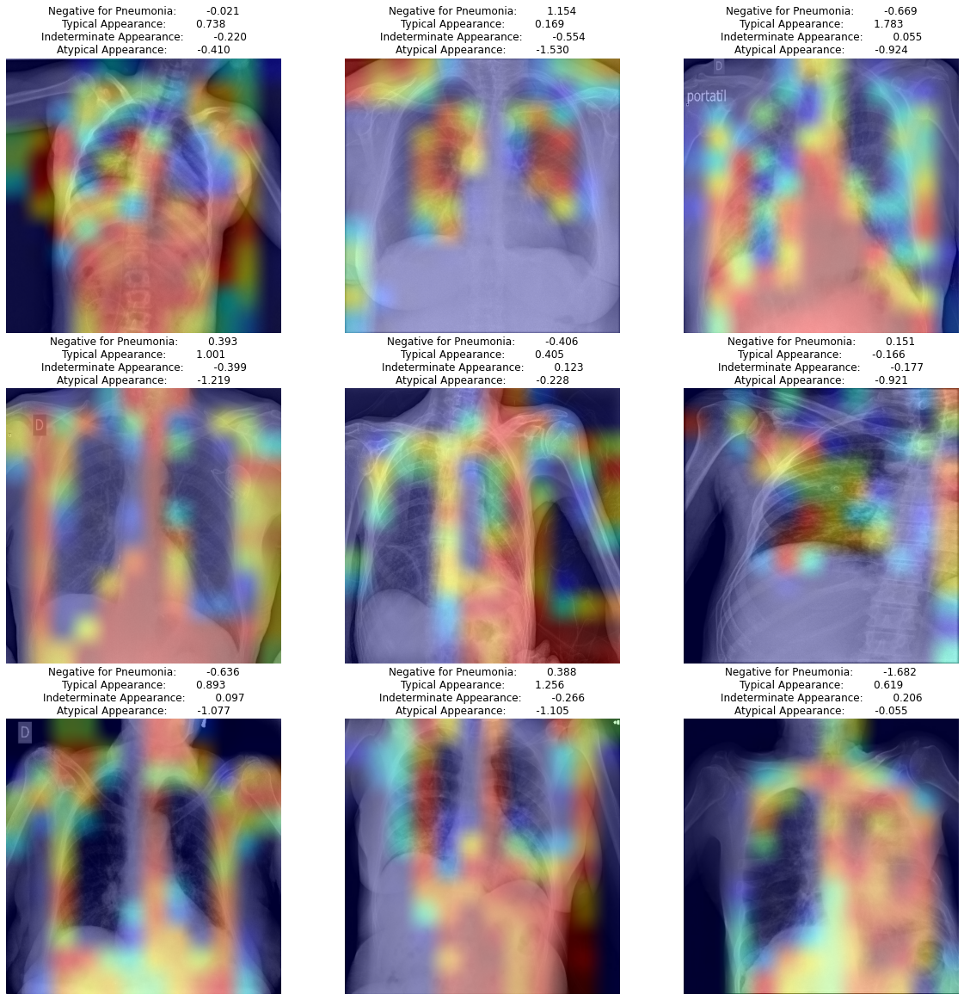

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][60:69], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

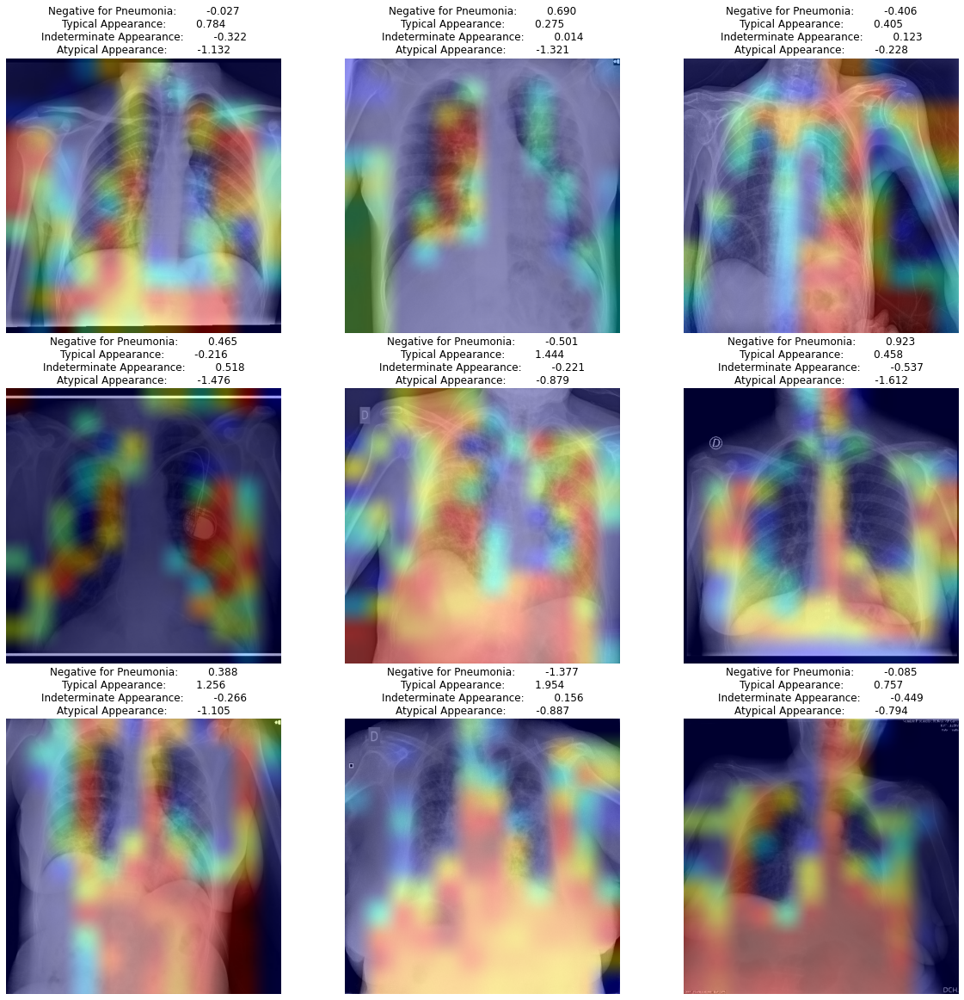

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][70:79], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

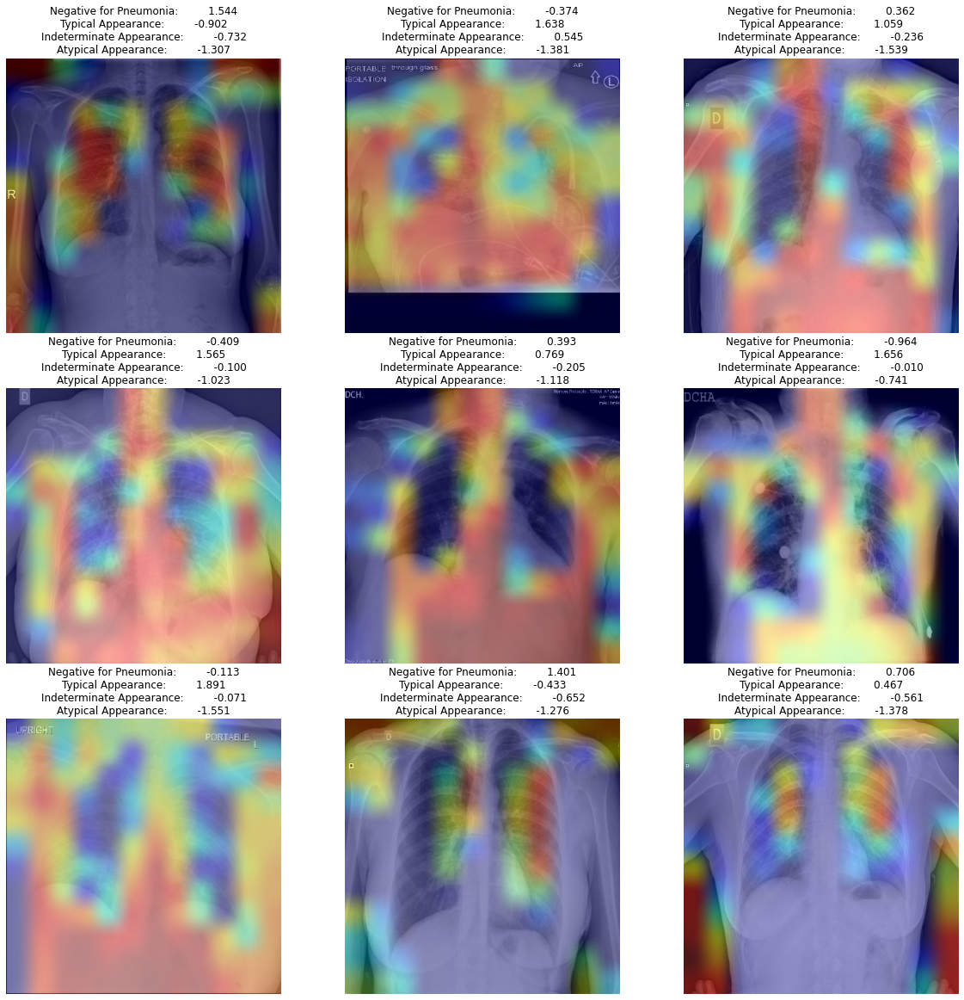

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][100:109], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

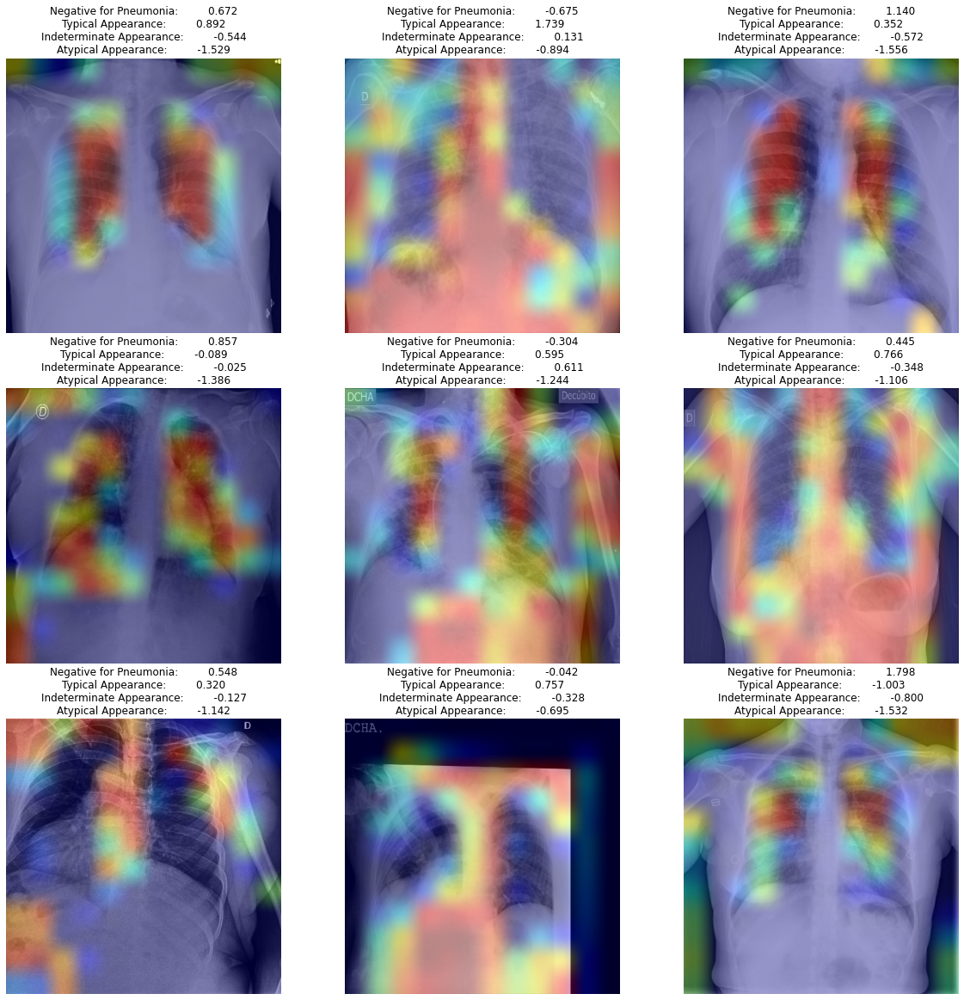

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][150:159], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

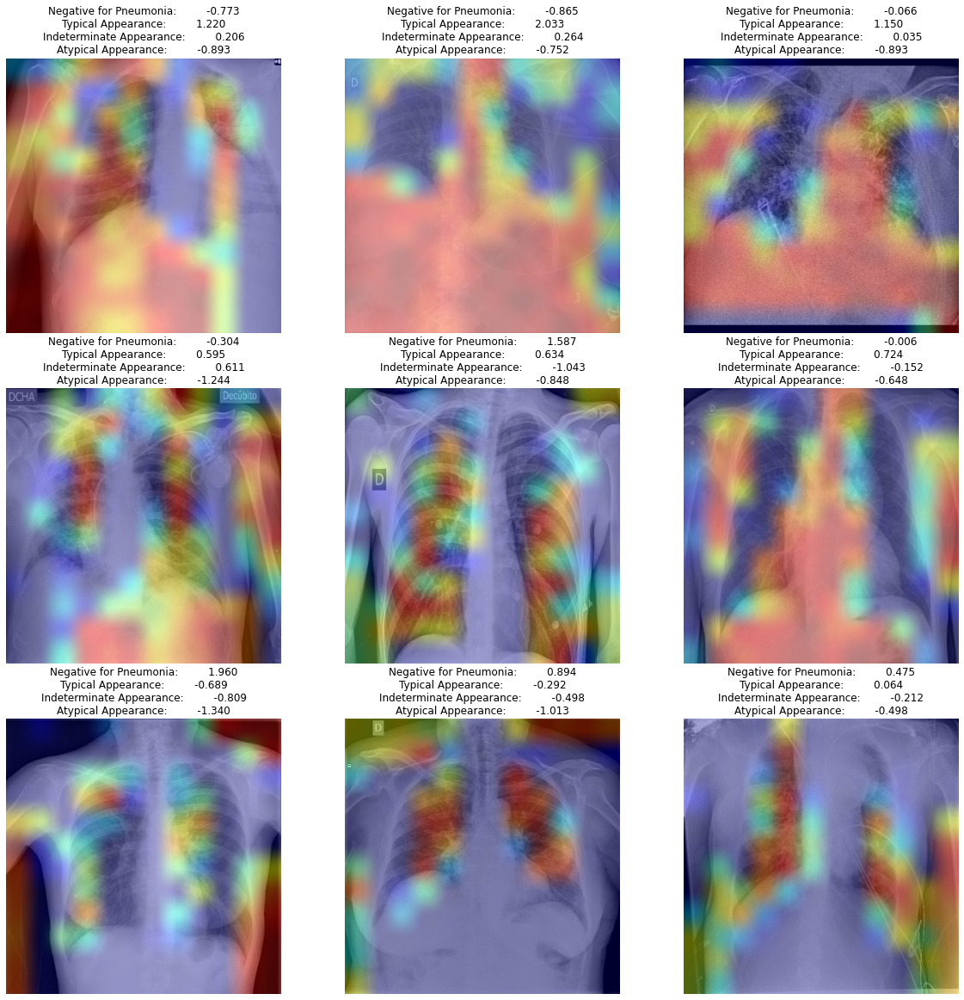

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][170:179], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

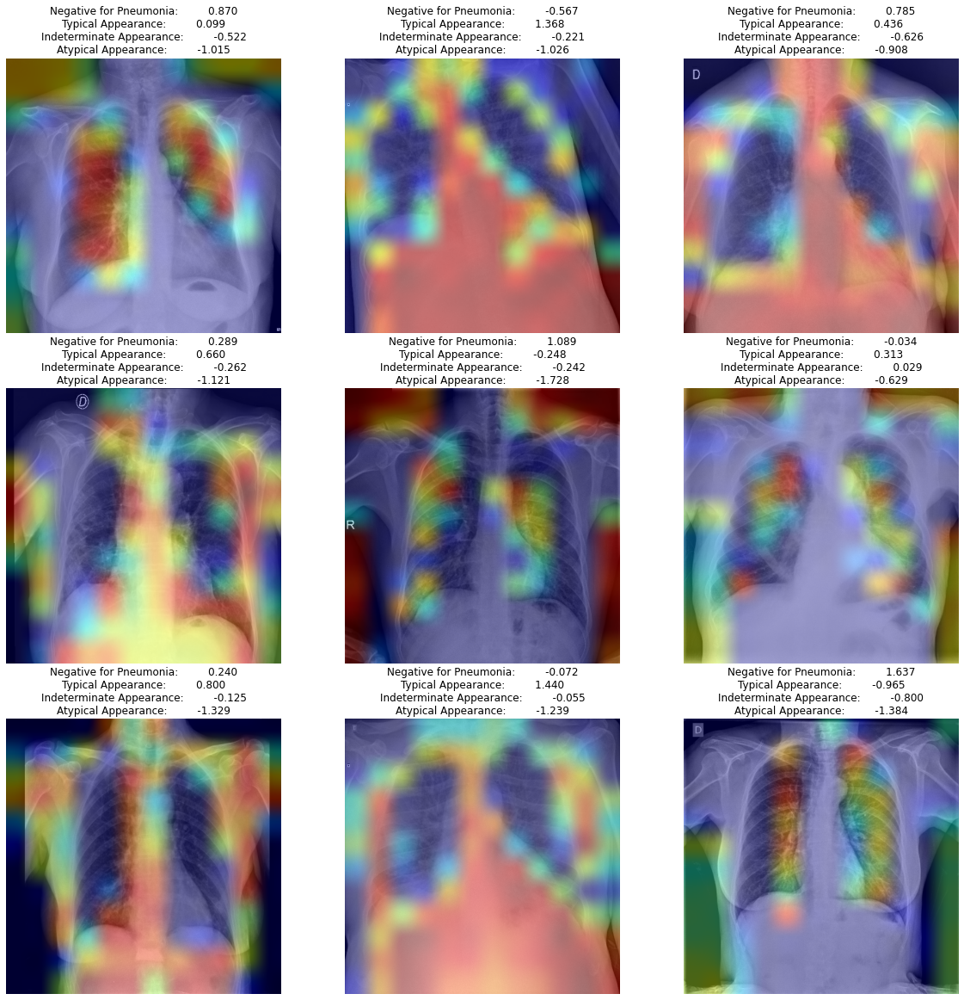

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][200:209], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    #vit_classifier.layers[0].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

### next set

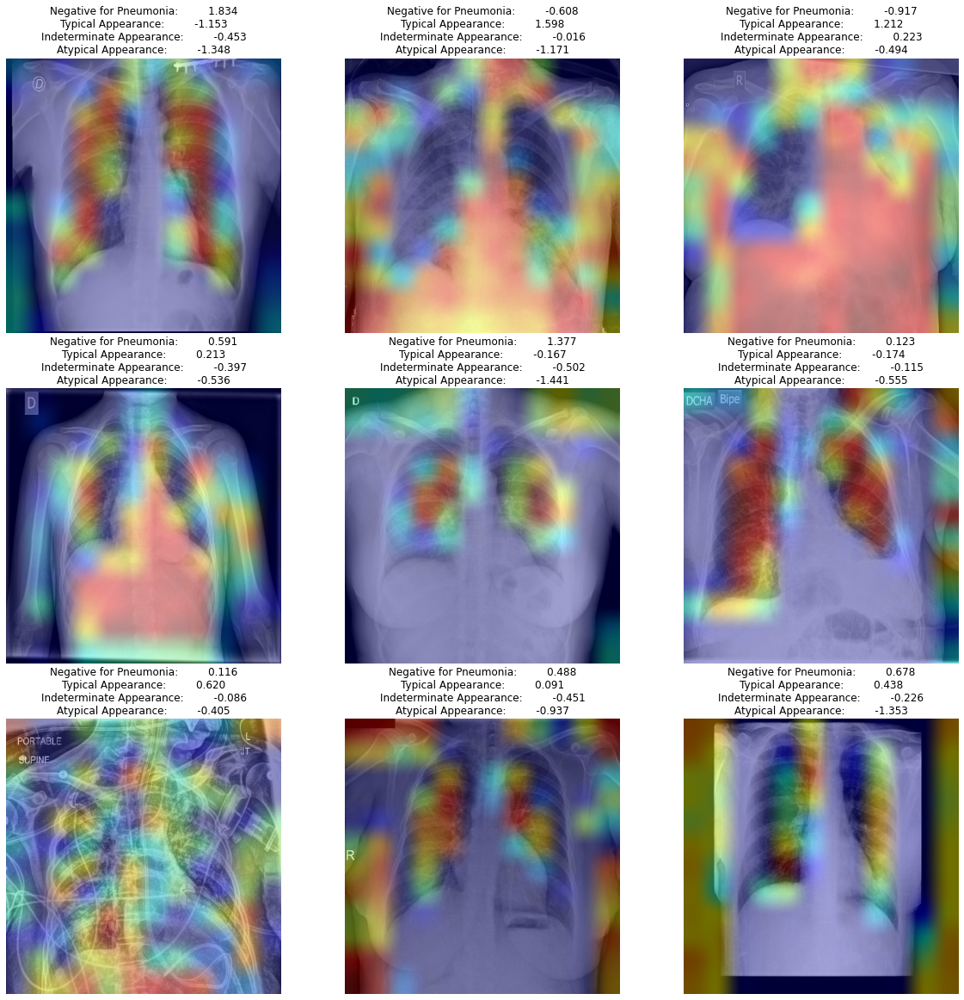

In [ ]:
fig, axis = plt.subplots(3, 3, figsize=(20, 20))
for images, ax in zip(next(iter(test_loader))[0][240:249], axis.flat):
    img_array =get_img_array(images)
    # Remove last layer's softmax
    vit_classifier.layers[-1].activation = None
    # Print what the top predicted class is
    preds = vit_classifier.predict(img_array)
    heatmap = gradcam_heatmap(img_array, vit_classifier, last_conv_layer_name)

    heatmap = np.reshape(heatmap, (12,12))
    display_gradcam(images, heatmap, preds=preds[0], plot=ax)

Submission

In [ ]:
submission = pd.DataFrame(collection[['image_id', 'StudyInstanceUID', 'Negative for Pneumonia', 'Typical Appearance', 'Indeterminate Appearance', 'Atypical Appearance', 'label']].copy())
submission.columns = ['Image_ID', 'StudyInstance UID', 'Negative for Pneumonia', 'Typical Appearance', 'Indeterminate Appearance', 'Atypical Appearance', 'Labels']
submission.to_csv('submission.csv', index=False)